In [1]:
import numpy as np
import pandas as pd
import os
from tqdm import tqdm
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.gridspec as gridspec
from datetime import datetime
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.decomposition import PCA
from scipy.signal import find_peaks
import matplotlib.patches as mpatches

In [2]:
df1 = pd.read_pickle('/home/niell_lab/data/freely_moving_ephys/batch_files/080421/pooled_ephys_unit_update_080421.pickle')

labeling by waveform
kmeans
pca
depth plot


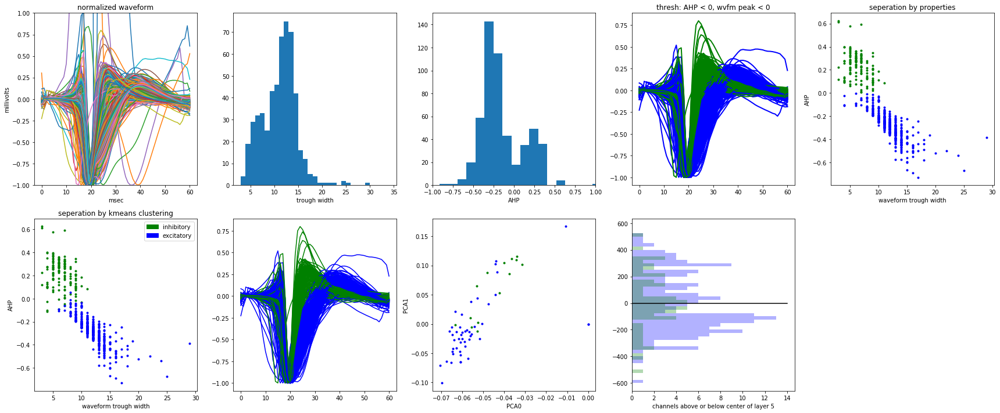

In [9]:
print('labeling by waveform')
plt.subplots(2,5, figsize=(24,10))
plt.subplot(2,5,1)
plt.title('normalized waveform')
df1['norm_waveform'] = df1['waveform']
for ind, row in df1.iterrows():
    if type(row['waveform']) == list:
        starting_val = np.mean(row['waveform'][:6])
        center_waveform = [i-starting_val for i in row['waveform']]
        norm_waveform = center_waveform / -np.min(center_waveform)
        plt.plot(norm_waveform)
        df1.at[ind, 'waveform_trough_width'] = len(norm_waveform[norm_waveform < -0.2])
        df1.at[ind, 'AHP'] = norm_waveform[27]
        df1.at[ind, 'waveform_peak'] = norm_waveform[18]
        df1.at[ind, 'norm_waveform'] = norm_waveform
plt.ylim([-1,1]); plt.ylabel('millivolts'); plt.xlabel('msec')

plt.subplot(2,5,2)
plt.hist(df1['waveform_trough_width'],bins=range(3,35))
plt.xlabel('trough width')

plt.subplot(2,5,3)
plt.xlabel('AHP')
plt.hist(df1['AHP'],bins=60); plt.xlim([-1,1])

plt.subplot(2,5,4)
plt.title('thresh: AHP < 0, wvfm peak < 0')
for ind, row in df1.iterrows():
    if row['AHP'] <=0 and row['waveform_peak'] < 0:
        plt.plot(row['norm_waveform'], 'b', linewidth=2)
        df1.at[ind, 'waveform_type'] = 'narrow'
    elif row['AHP'] > 0 and row['waveform_peak'] < 0:
        plt.plot(row['norm_waveform'], 'g', linewidth=2)
        df1.at[ind, 'waveform_type'] = 'broad'
    else:
        df1.at[ind, 'waveform_type'] = 'bad'

plt.subplot(2,5,5)
plt.title('seperation by properties')
plt.plot(df1['waveform_trough_width'][df1['waveform_peak'] < 0][df1['waveform_type']=='broad'], df1['AHP'][df1['waveform_peak'] < 0][df1['waveform_type']=='broad'], 'g.')
plt.plot(df1['waveform_trough_width'][df1['waveform_peak'] < 0][df1['waveform_type']=='narrow'], df1['AHP'][df1['waveform_peak'] < 0][df1['waveform_type']=='narrow'], 'b.')
plt.ylabel('AHP'); plt.xlabel('waveform trough width')

print('kmeans')
plt.subplot(2,5,6)
km_labels = KMeans(n_clusters=2).fit(list(df1['norm_waveform'][df1['waveform_peak'] < 0].to_numpy())).labels_

# make excitatory (fast spiking) always group 0
# excitatory should always have a smaller mean waveform trough
# if it's larger, flip the kmeans labels
if np.mean(df1['waveform_trough_width'][df1['waveform_peak']<0][km_labels==0]) > np.mean(df1['waveform_trough_width'][df1['waveform_peak']<0][km_labels==1]):
    km_labels = [0 if i==1 else 1 for i in km_labels]

count = 0
for ind, row in df1.iterrows():
    if row['waveform_peak'] < 0:
        df1.at[ind, 'waveform_km_label'] = km_labels[count]
        count = count+1
        
plt.plot(df1['waveform_trough_width'][df1['waveform_peak'] < 0][df1['waveform_km_label']==0], df1['AHP'][df1['waveform_peak'] < 0][df1['waveform_km_label']==0], 'g.')
plt.plot(df1['waveform_trough_width'][df1['waveform_peak'] < 0][df1['waveform_km_label']==1], df1['AHP'][df1['waveform_peak'] < 0][df1['waveform_km_label']==1], 'b.')
plt.legend(['kmeans=0', 'kmeans=1'])
plt.ylabel('AHP'); plt.xlabel('waveform trough width')
plt.title('seperation by kmeans clustering')
bluepatch = mpatches.Patch(color='g', label='inhibitory')
greenpatch = mpatches.Patch(color='b', label='excitatory')
plt.legend(handles=[bluepatch, greenpatch])

plt.subplot(2,5,7)
for ind, row in df1.iterrows():
    if row['waveform_km_label']==0:
        plt.plot(row['norm_waveform'], 'g')
    elif row['waveform_km_label']==1:
        plt.plot(row['norm_waveform'], 'b')

print('pca')
plt.subplot(2,5,8)
pca_in = np.zeros([379,61])
for i in range(len(df1['norm_waveform'][df1['waveform_peak'] < 0])):
    try:
        pca_in[i,:] = df1['norm_waveform'][df1['waveform_peak'] < 0][i]
    except:
        pass
pca = PCA(n_components=2)
fit = pca.fit_transform(pca_in.T)
components = pca.components_
pca_ref = df1[df1['waveform_peak'] < 0].copy()
i = 0
for ind, row in pca_ref.iterrows():
    if i < 61:
        if row['waveform_km_label']==0:
            plt.plot(components[0,i].T,components[1,i],'g.')
        elif row['waveform_km_label']==1:
            plt.plot(components[0,i],components[1,i],'b.')
        i += 1
plt.ylabel('PCA1'); plt.xlabel('PCA0')

print('depth plot')
plt.subplot(2,5,9)
plt.hist(df1['hf1_wn_depth_from_layer5'][df1['waveform_km_label']==1],color='b',bins=np.arange(-600,600,25),alpha=0.3,orientation='horizontal')
plt.hist(df1['hf1_wn_depth_from_layer5'][df1['waveform_km_label']==0],color='g',bins=np.arange(-600,600,25),alpha=0.3,orientation='horizontal')
plt.xlabel('channels above or below center of layer 5')
plt.plot([0,14],[0,0],'k')

plt.subplot(2,5,10)
plt.axis('off')

plt.tight_layout()
plt.show()

In [10]:
for ind, row in df1.iterrows():
    tuning = row['hf1_wn_crf_tuning']
    if type(tuning) == np.ndarray or type(tuning) == list:
        tuning = [x for x in tuning if x != None]
        # thresh out units which have a small response to contrast, even if the modulation index is large
        df1.at[ind, 'responsive_to_contrast'] = np.abs(tuning[-2] - tuning[1]) > 1
    else:
        df1.at[ind, 'responsive_to_contrast'] = False
        
depth_range = [np.max(df1['hf1_wn_depth_from_layer5'][df1['responsive_to_contrast']==True]), np.min(df1['hf1_wn_depth_from_layer5'][df1['responsive_to_contrast']==True])]

In [11]:
def plot_var_vs_var(df1, xvar, yvar, n, filter_for=None, force_range=None, along_y=False):
    """
    filter_for: dict of value to require for a column of the dataframe
    """
    fig = plt.subplot(3,5,n)
    if force_range is None:
        force_range = np.arange(-0.3,0.305,0.05)
    for km in range(2):
        if km == 0:
            c = 'g'
        elif km == 1:
            c = 'b'
        x = df1[xvar][df1['waveform_km_label']==km]
        y = df1[yvar][df1['waveform_km_label']==km]
        if filter_for is not None:
            for key, val in filter_for.items():
                x = x[df1[key]==val]
                y = y[df1[key]==val]
        x = x.to_numpy().astype(float)
        y = y.to_numpy().astype(float)
        if along_y == False:
            bin_means, bin_edges, bin_number = stats.binned_statistic(x[~np.isnan(x) & ~np.isnan(y)], y[~np.isnan(x) & ~np.isnan(y)], statistic='mean', bins=force_range)
            bin_std, _, _ = stats.binned_statistic(x[~np.isnan(x) & ~np.isnan(y)], y[~np.isnan(x) & ~np.isnan(y)], statistic='std', bins=force_range)
            hist, _ = np.histogram(x[~np.isnan(x) & ~np.isnan(y)], bins=force_range)
        elif along_y == True:
            bin_means, bin_edges, bin_number = stats.binned_statistic(y[~np.isnan(x) & ~np.isnan(y)], x[~np.isnan(x) & ~np.isnan(y)], statistic='mean', bins=force_range)
            bin_std, _, _ = stats.binned_statistic(y[~np.isnan(x) & ~np.isnan(y)], x[~np.isnan(x) & ~np.isnan(y)], statistic='std', bins=force_range)
            hist, _ = np.histogram(y[~np.isnan(x) & ~np.isnan(y)], bins=force_range)
        tuning_err = bin_std / np.sqrt(hist)
        plt.plot(x, y, c+'.')
        if along_y == False:
            plt.plot(bin_edges[:-1], bin_means, c+'-')
            plt.fill_between(bin_edges[:-1], bin_means-tuning_err, bin_means+tuning_err, color=c, alpha=0.3)
            num_outliers = len([i for i in x if i>np.max(force_range) or i<np.min(force_range)])
            plt.xlim([np.min(force_range), np.max(force_range)])
        elif along_y == True:
            plt.plot(bin_means, bin_edges[:-1], c+'-')
            plt.fill_betweenx(bin_edges[:-1], bin_means-tuning_err, bin_means+tuning_err, color=c, alpha=0.3)
            num_outliers = len([i for i in y if i>np.max(force_range) or i<np.min(force_range)])
            plt.gca().invert_yaxis()
    plt.title('excluded='+str(num_outliers))
    return fig

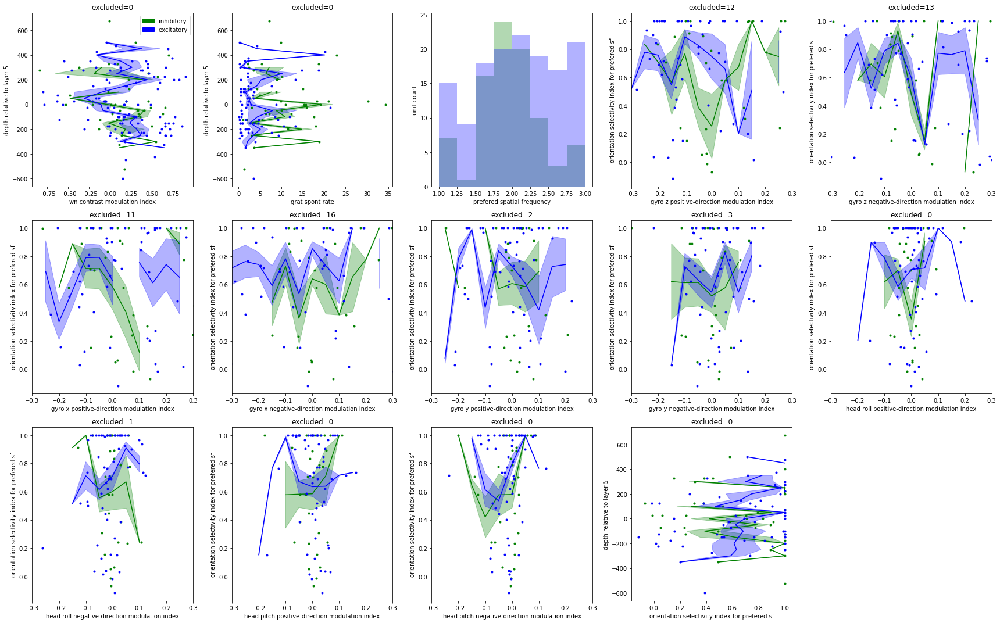

In [16]:
plt.subplots(3,5, figsize=(24,15))
n = 1

fig = plot_var_vs_var(df1, 'hf1_wn_crf_modind', 'hf1_wn_depth_from_layer5', n, filter_for={'responsive_to_contrast':True}, force_range=np.arange(-650,650,50), along_y=True)
plt.ylabel('depth relative to layer 5'); plt.xlabel('wn contrast modulation index'); plt.legend(handles=[bluepatch, greenpatch])

for sf in ['low','mid','high']:
    df1['norm_ori_tuning_'+sf] = df1['hf3_gratings_ori_tuning'].copy().astype(object)
for ind, row in df1.iterrows():
    try:
        orientations = np.nanmean(np.array(row['hf3_gratings_ori_tuning'], dtype=np.float),2)
        for sfnum in range(3):
            sf = ['low','mid','high'][sfnum]
            df1.at[ind,'norm_ori_tuning_'+sf] = orientations[:,sfnum] - row['hf3_gratings_drift_spont']
        mean_for_sf = np.array([np.mean(df1.at[ind,'norm_ori_tuning_low']), np.mean(df1.at[ind,'norm_ori_tuning_mid']), np.mean(df1.at[ind,'norm_ori_tuning_high'])])
        mean_for_sf[mean_for_sf<0] = 0
        df1.at[ind,'sf_pref'] = ((mean_for_sf[0]*1)+(mean_for_sf[1]*2)+(mean_for_sf[2]*3))/np.sum(mean_for_sf)
        df1.at[ind,'responsive_to_gratings'] = [True if np.max(mean_for_sf)>2 else False][0]
    except:
        for sfnum in range(3):
            sf = ['low','mid','high'][sfnum]
            df1.at[ind,'norm_ori_tuning_'+sf] = None
        df1.at[ind,'responsive_to_gratings'] = False
        df1.at[ind,'sf_pref'] = np.nan

n += 1
fig = plot_var_vs_var(df1, 'hf3_gratings_drift_spont', 'hf1_wn_depth_from_layer5', n, filter_for={'responsive_to_gratings':True}, force_range=np.arange(-650,650,50), along_y=True)
plt.ylabel('depth relative to layer 5'); plt.xlabel('grat spont rate')

n += 1
plt.subplot(3,5,n)
plt.hist(df1['sf_pref'][df1['responsive_to_gratings']==True][df1['waveform_km_label']==0], color='g', alpha=0.3, bins=np.arange(1,3.25,0.25))
plt.hist(df1['sf_pref'][df1['responsive_to_gratings']==True][df1['waveform_km_label']==1], color='b', alpha=0.3, bins=np.arange(1,3.25,0.25))
plt.xlabel('prefered spatial frequency'); plt.ylabel('unit count')

df1['osi_for_sf_pref'] = np.nan
df1['dsi_for_sf_pref'] = np.nan
for ind, row in df1.iterrows():
    if ~np.isnan(row['sf_pref']):
        best_sf_pref = int(np.round(row['sf_pref']))
        df1.at[ind, 'osi_for_sf_pref'] = row[(['hf3_gratings_osi_low','hf3_gratings_osi_mid','hf3_gratings_osi_high'][best_sf_pref-1])]
        df1.at[ind, 'dsi_for_sf_pref'] = row[(['hf3_gratings_dsi_low','hf3_gratings_dsi_mid','hf3_gratings_dsi_high'][best_sf_pref-1])]

n += 1
fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_gz_modind_pos', 'osi_for_sf_pref', n, filter_for={'responsive_to_gratings':True})
plt.ylabel('orientation selectivity index for prefered sf'); plt.xlabel('gyro z positive-direction modulation index')

n += 1
fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_gz_modind_neg', 'osi_for_sf_pref', n, filter_for={'responsive_to_gratings':True})
plt.ylabel('orientation selectivity index for prefered sf'); plt.xlabel('gyro z negative-direction modulation index')

n += 1
fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_gx_modind_pos', 'osi_for_sf_pref', n, filter_for={'responsive_to_gratings':True})
plt.ylabel('orientation selectivity index for prefered sf'); plt.xlabel('gyro x positive-direction modulation index')

n += 1
fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_gx_modind_neg', 'osi_for_sf_pref', n, filter_for={'responsive_to_gratings':True})
plt.ylabel('orientation selectivity index for prefered sf'); plt.xlabel('gyro x negative-direction modulation index')

n += 1
fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_gy_modind_pos', 'osi_for_sf_pref', n, filter_for={'responsive_to_gratings':True})
plt.ylabel('orientation selectivity index for prefered sf'); plt.xlabel('gyro y positive-direction modulation index')

n += 1
fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_gy_modind_neg', 'osi_for_sf_pref', n, filter_for={'responsive_to_gratings':True})
plt.ylabel('orientation selectivity index for prefered sf'); plt.xlabel('gyro y negative-direction modulation index')

n += 1
fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_roll_modind_pos', 'osi_for_sf_pref', n, filter_for={'responsive_to_gratings':True})
plt.ylabel('orientation selectivity index for prefered sf'); plt.xlabel('head roll positive-direction modulation index')

n += 1
fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_roll_modind_neg', 'osi_for_sf_pref', n, filter_for={'responsive_to_gratings':True})
plt.ylabel('orientation selectivity index for prefered sf'); plt.xlabel('head roll negative-direction modulation index')

n += 1
fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_pitch_modind_pos', 'osi_for_sf_pref', n, filter_for={'responsive_to_gratings':True})
plt.ylabel('orientation selectivity index for prefered sf'); plt.xlabel('head pitch positive-direction modulation index')

n += 1
fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_pitch_modind_neg', 'osi_for_sf_pref', n, filter_for={'responsive_to_gratings':True})
plt.ylabel('orientation selectivity index for prefered sf'); plt.xlabel('head pitch negative-direction modulation index')

n += 1
fig = plot_var_vs_var(df1, 'osi_for_sf_pref', 'hf1_wn_depth_from_layer5', n, filter_for={'responsive_to_gratings':True}, force_range=np.arange(-650,650,50), along_y=True)
plt.xlabel('orientation selectivity index for prefered sf'); plt.ylabel('depth relative to layer 5')

n += 1
plt.subplot(3,5,n)
plt.axis('off')

plt.tight_layout()
plt.show()

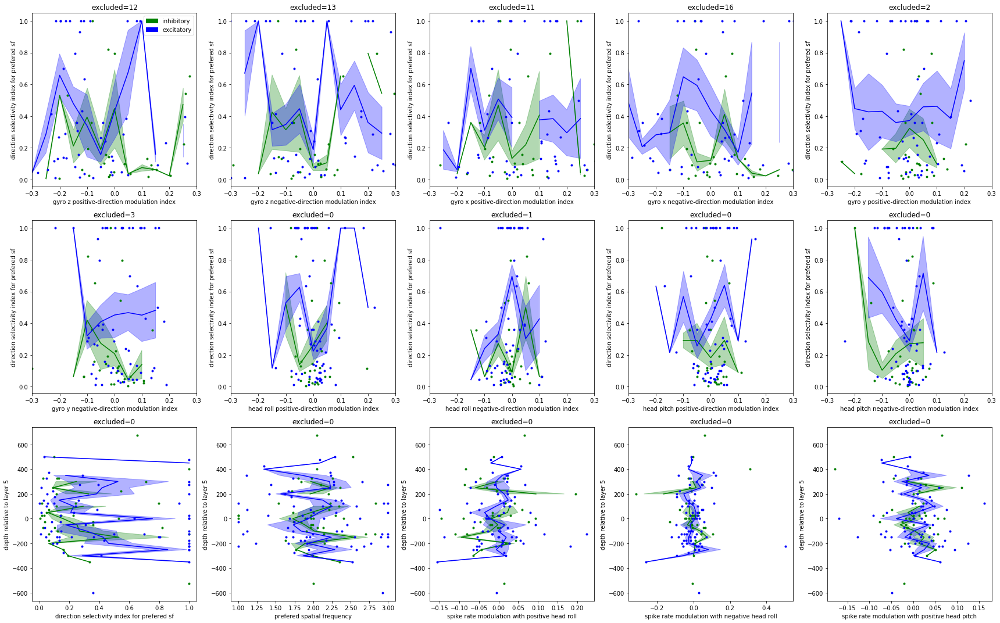

In [17]:
plt.subplots(3,5, figsize=(24,15))
n = 1

fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_gz_modind_pos', 'dsi_for_sf_pref', n, filter_for={'responsive_to_gratings':True})
plt.ylabel('direction selectivity index for prefered sf'); plt.xlabel('gyro z positive-direction modulation index'); plt.legend(handles=[bluepatch, greenpatch])

n += 1
fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_gz_modind_neg', 'dsi_for_sf_pref', n, filter_for={'responsive_to_gratings':True})
plt.ylabel('direction selectivity index for prefered sf'); plt.xlabel('gyro z negative-direction modulation index')

n += 1
fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_gx_modind_pos', 'dsi_for_sf_pref', n, filter_for={'responsive_to_gratings':True})
plt.ylabel('direction selectivity index for prefered sf'); plt.xlabel('gyro x positive-direction modulation index')

n += 1
fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_gx_modind_neg', 'dsi_for_sf_pref', n, filter_for={'responsive_to_gratings':True})
plt.ylabel('direction selectivity index for prefered sf'); plt.xlabel('gyro x negative-direction modulation index')

n += 1
fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_gy_modind_pos', 'dsi_for_sf_pref', n, filter_for={'responsive_to_gratings':True})
plt.ylabel('direction selectivity index for prefered sf'); plt.xlabel('gyro y positive-direction modulation index')

n += 1
fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_gy_modind_neg', 'dsi_for_sf_pref', n, filter_for={'responsive_to_gratings':True})
plt.ylabel('direction selectivity index for prefered sf'); plt.xlabel('gyro y negative-direction modulation index')

n += 1
fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_roll_modind_pos', 'dsi_for_sf_pref', n, filter_for={'responsive_to_gratings':True})
plt.ylabel('direction selectivity index for prefered sf'); plt.xlabel('head roll positive-direction modulation index')

n += 1
fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_roll_modind_neg', 'dsi_for_sf_pref', n, filter_for={'responsive_to_gratings':True})
plt.ylabel('direction selectivity index for prefered sf'); plt.xlabel('head roll negative-direction modulation index')

n += 1
fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_pitch_modind_pos', 'dsi_for_sf_pref', n, filter_for={'responsive_to_gratings':True})
plt.ylabel('direction selectivity index for prefered sf'); plt.xlabel('head pitch positive-direction modulation index')

n += 1
fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_pitch_modind_neg', 'dsi_for_sf_pref', n, filter_for={'responsive_to_gratings':True})
plt.ylabel('direction selectivity index for prefered sf'); plt.xlabel('head pitch negative-direction modulation index')

n += 1
fig = plot_var_vs_var(df1, 'dsi_for_sf_pref', 'hf1_wn_depth_from_layer5', n, filter_for={'responsive_to_gratings':True}, force_range=np.arange(-650,650,50), along_y=True)
plt.xlabel('direction selectivity index for prefered sf'); plt.ylabel('depth relative to layer 5')

n += 1
fig = plot_var_vs_var(df1, 'sf_pref', 'hf1_wn_depth_from_layer5', n, filter_for={'responsive_to_gratings':True}, force_range=np.arange(-650,650,50), along_y=True)
plt.xlabel('prefered spatial frequency'); plt.ylabel('depth relative to layer 5')

n += 1
fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_roll_modind_pos', 'hf1_wn_depth_from_layer5', n, filter_for={'responsive_to_gratings':True}, force_range=np.arange(-650,650,50), along_y=True)
plt.xlabel('spike rate modulation with positive head roll'); plt.ylabel('depth relative to layer 5')

n += 1
fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_roll_modind_neg', 'hf1_wn_depth_from_layer5', n, filter_for={'responsive_to_gratings':True}, force_range=np.arange(-650,650,50), along_y=True)
plt.xlabel('spike rate modulation with negative head roll'); plt.ylabel('depth relative to layer 5')

n += 1
fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_pitch_modind_pos', 'hf1_wn_depth_from_layer5', n, filter_for={'responsive_to_gratings':True}, force_range=np.arange(-650,650,50), along_y=True)
plt.xlabel('spike rate modulation with positive head pitch'); plt.ylabel('depth relative to layer 5')

plt.tight_layout()
plt.show()

In [18]:
crfs0 = np.zeros([len(df1['hf1_wn_crf_tuning'][df1['waveform_km_label']==0]),11])
crfs1 = np.zeros([len(df1['hf1_wn_crf_tuning'][df1['waveform_km_label']==1]),11])
for i in range(len(df1['hf1_wn_crf_tuning'][df1['waveform_km_label']==0])):
    try:
        crfs0[i,:] = df1['hf1_wn_crf_tuning'][df1['waveform_km_label']==0][i]
    except:
        pass
for i in range(len(df1['hf1_wn_crf_tuning'][df1['waveform_km_label']==1])):
    try:
        crfs1[i,:] = df1['hf1_wn_crf_tuning'][df1['waveform_km_label']==1][i]
    except:
        pass

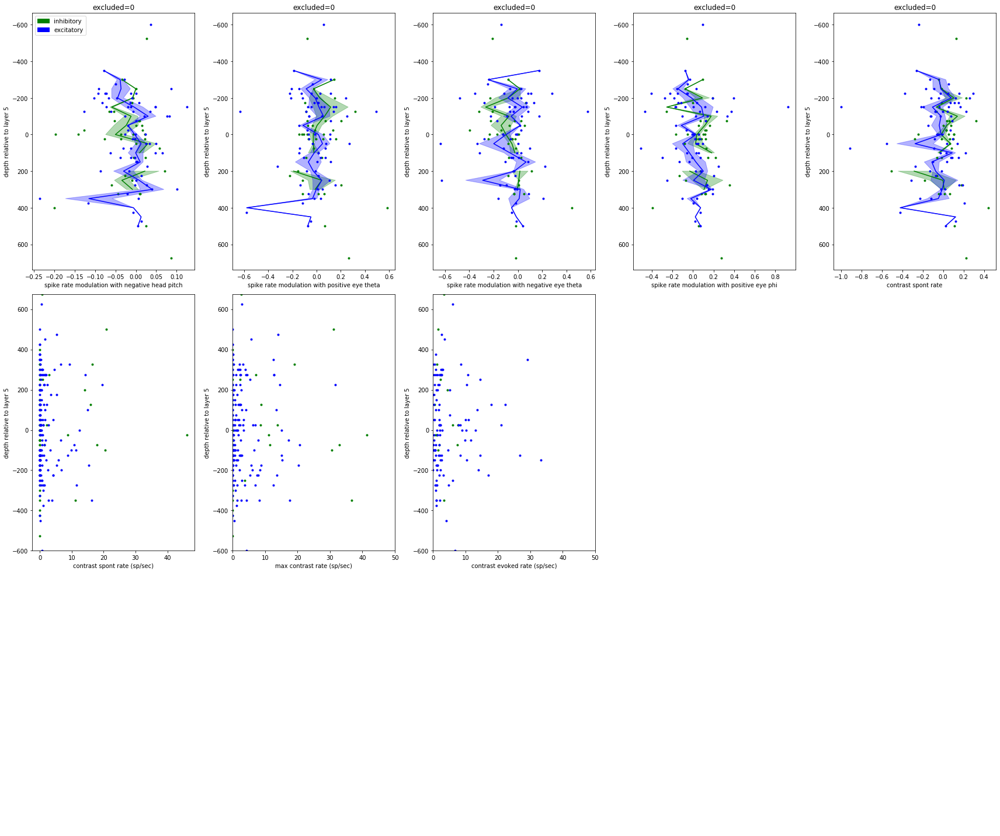

In [84]:
plt.subplots(3,5, figsize=(24,20))
n = 1

fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_pitch_modind_neg', 'hf1_wn_depth_from_layer5', n, filter_for={'responsive_to_gratings':True}, force_range=np.arange(-650,650,50), along_y=True)
plt.xlabel('spike rate modulation with negative head pitch'); plt.ylabel('depth relative to layer 5'); plt.legend(handles=[bluepatch, greenpatch])
plt.gca().invert_yaxis()
n += 1
fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_theta_modind_pos', 'hf1_wn_depth_from_layer5', n, filter_for={'responsive_to_gratings':True}, force_range=np.arange(-650,650,50), along_y=True)
plt.xlabel('spike rate modulation with positive eye theta'); plt.ylabel('depth relative to layer 5')
plt.gca().invert_yaxis()
n += 1
fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_theta_modind_neg', 'hf1_wn_depth_from_layer5', n, filter_for={'responsive_to_gratings':True}, force_range=np.arange(-650,650,50), along_y=True)
plt.xlabel('spike rate modulation with negative eye theta'); plt.ylabel('depth relative to layer 5')
plt.gca().invert_yaxis()
n += 1
fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_phi_modind_pos', 'hf1_wn_depth_from_layer5', n, filter_for={'responsive_to_gratings':True}, force_range=np.arange(-650,650,50), along_y=True)
plt.xlabel('spike rate modulation with positive eye phi'); plt.ylabel('depth relative to layer 5')
plt.gca().invert_yaxis()
n += 1
fig = plot_var_vs_var(df1, 'fm1_spike_rate_vs_phi_modind_neg', 'hf1_wn_depth_from_layer5', n, filter_for={'responsive_to_gratings':True}, force_range=np.arange(-650,650,50), along_y=True)
plt.xlabel('contrast spont rate'); plt.ylabel('depth relative to layer 5')
plt.gca().invert_yaxis()
n += 1
plt.subplot(3,5,n)
plt.ylabel('depth relative to layer 5'); plt.xlabel('contrast spont rate (sp/sec)')
plt.plot(crfs0[:,0], df1['hf1_wn_depth_from_layer5'][df1['waveform_km_label']==0], 'g.')
plt.plot(crfs1[:,0], df1['hf1_wn_depth_from_layer5'][df1['waveform_km_label']==1], 'b.'); plt.ylim(depth_range)
plt.gca().invert_yaxis()
n += 1
plt.subplot(3,5,n)
plt.ylabel('depth relative to layer 5'); plt.xlabel('max contrast rate (sp/sec)')
plt.plot(crfs0[:,-1], df1['hf1_wn_depth_from_layer5'][df1['waveform_km_label']==0], 'g.'); plt.xlim([0,50])
plt.plot(crfs1[:,-1], df1['hf1_wn_depth_from_layer5'][df1['waveform_km_label']==1], 'b.'); plt.ylim(depth_range)
plt.gca().invert_yaxis()
n += 1
plt.subplot(3,5,n)
plt.ylabel('depth relative to layer 5'); plt.xlabel('contrast evoked rate (sp/sec)')
plt.plot(crfs0[:,-1]/crfs0[:,0], df1['hf1_wn_depth_from_layer5'][df1['waveform_km_label']==0], 'g.'); plt.xlim([0,50])
plt.plot(crfs1[:,-1]/crfs1[:,0], df1['hf1_wn_depth_from_layer5'][df1['waveform_km_label']==1], 'b.'); plt.ylim(depth_range)
plt.gca().invert_yaxis()
for i in range(9,16):
    plt.subplot(3,5,i)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [20]:
waveform_keys = ['fm1_upsacc_avg_gaze_shift_dEye', 'fm1_downsacc_avg_gaze_shift_dEye', 'fm1_upsacc_avg_gaze_shift_dHead', 'fm1_downsacc_avg_gaze_shift_dHead']
waveforms = df1[waveform_keys].values.flatten()
wv_inds = list(np.floor(np.arange(0, len(df1[waveform_keys].values), 1/len(waveform_keys))).astype(int))
baselines = np.zeros([len(waveforms), 1])
nested_waveforms = np.zeros([len(waveforms), 20])
for ind in range(len(waveforms)):
    wv = waveforms[ind]
    if type(wv) == np.ndarray:
        baseline = np.mean(wv[:25])
        cent_wv = [i-baseline for i in wv]
        nested_waveforms[ind] = cent_wv[35:55]
        baselines[ind] = baseline
    else:
        baselines[ind] = np.nan
wvlen = len(nested_waveforms[0])
flat_waveforms = np.zeros([len(nested_waveforms), wvlen])
unnorm_waveforms = np.zeros([len(nested_waveforms), wvlen])
for i in range(len(nested_waveforms)):
    if ~np.isnan(nested_waveforms[i]).all():
        if (np.max(np.abs(nested_waveforms[i]))/baselines[i]) > 0.1 and np.max(np.abs(nested_waveforms[i]))>4:
            flat_waveforms[i,:] = nested_waveforms[i] / np.max(np.abs(nested_waveforms[i]))
        unnorm_waveforms[i,:] = nested_waveforms[i]
km_labels = KMeans(n_clusters=5).fit(flat_waveforms[~np.isnan(flat_waveforms).any(axis=1)]).labels_
km_labels = np.nan_to_num(km_labels, 0)
for ind, row in df1.iterrows():
    unit_clusters = km_labels[[i for i, x in enumerate(wv_inds) if x == ind]]
    if unit_clusters != []:
        for keynum in range(len(waveform_keys)):
            df1.at[ind, waveform_keys[keynum]+'_cluster'] = unit_clusters[keynum]

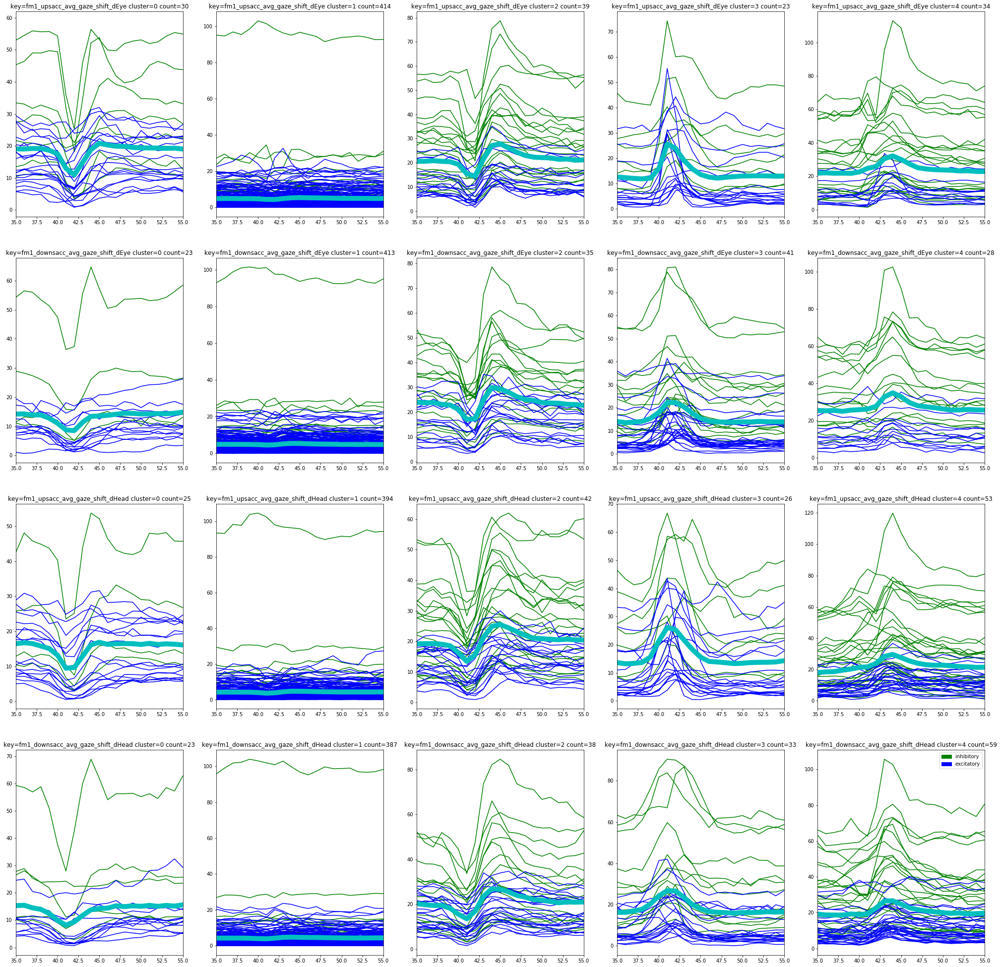

In [85]:
plt.subplots(4,5, figsize=(35,35))
count = 1
mean_cluster_all_keys = {}
colors = plt.cm.jet(np.arange(-650,650))
for key in waveform_keys:
    mean_cluster = []
    for label in range(5):
        plt.subplot(4,5,count)
        plt.title('key='+str(key)+' cluster='+str(label)+' count='+str(np.nansum(np.nan_to_num(np.array(df1[key+'_cluster']), 0)==label)))
        inhibitory_nested = df1[key][df1[key+'_cluster']==label][df1['waveform_km_label']==0].ravel()
        inhibitory = np.zeros([len(inhibitory_nested),len(inhibitory_nested[0])])
        for i in range(len(inhibitory_nested)):
            inhibitory[i,:] = inhibitory_nested[i]
        plt.plot(inhibitory.T, 'g')
        excitatory_nested = df1[key][df1[key+'_cluster']==label][df1['waveform_km_label']==1].ravel()
        excitatory = np.zeros([len(excitatory_nested),len(excitatory_nested[0])])
        for i in range(len(excitatory_nested)):
            excitatory[i,:] = excitatory_nested[i]
        plt.plot(excitatory.T, 'b')
        all_units = np.nanmean(np.concatenate([inhibitory, excitatory], axis=0), axis=0)
        mean_cluster.append(all_units)
        plt.plot(all_units, 'y', linewidth=10)
        count += 1
        plt.xlim([35,55])
    mean_cluster_all_keys[key] = mean_cluster
plt.legend(handles=[bluepatch, greenpatch])

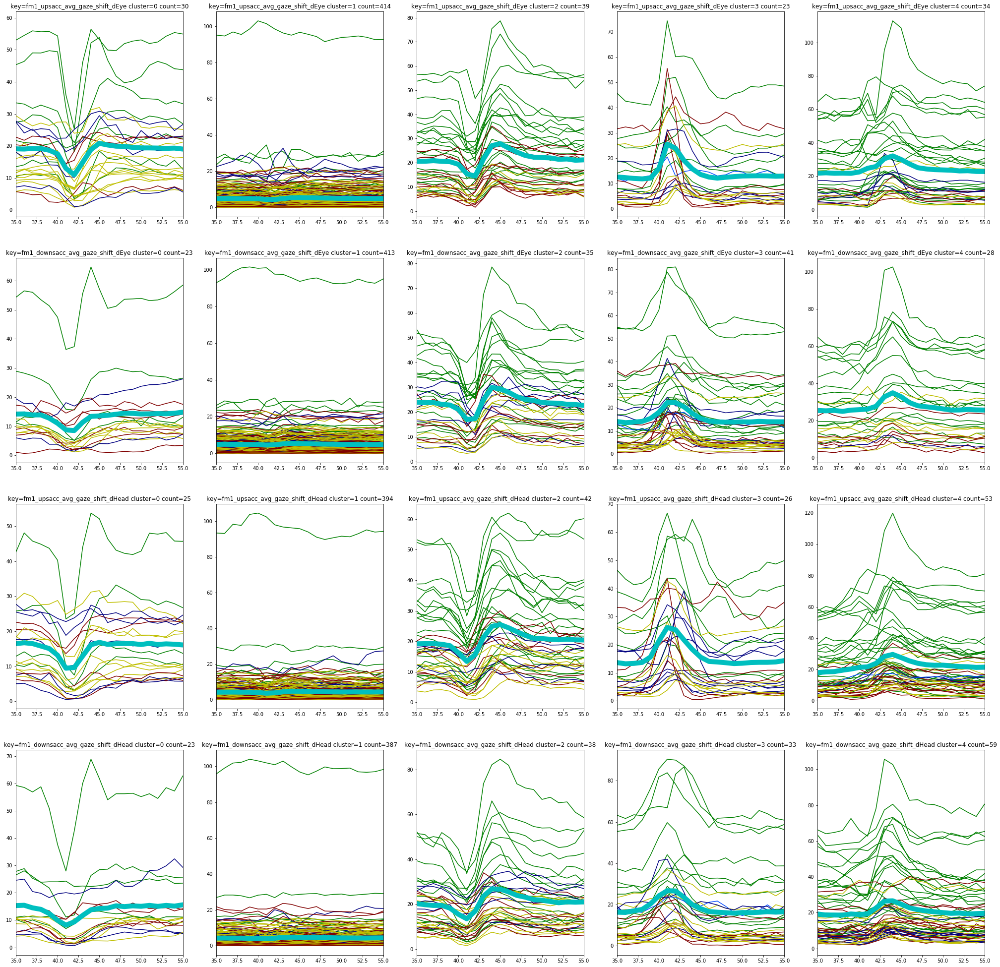

In [21]:
plt.subplots(4,5, figsize=(35,35))
count = 1
mean_cluster_all_keys = {}
colors = plt.cm.jet(np.arange(-650,650))
for key in waveform_keys:
    mean_cluster = []
    for label in range(5):
        plt.subplot(4,5,count)
        plt.title('key='+str(key)+' cluster='+str(label)+' count='+str(np.nansum(np.nan_to_num(np.array(df1[key+'_cluster']), 0)==label)))
        inhibitory_nested = df1[key][df1[key+'_cluster']==label][df1['waveform_km_label']==0].ravel()
        inhibitory = np.zeros([len(inhibitory_nested),len(inhibitory_nested[0])])
        for i in range(len(inhibitory_nested)):
            inhibitory[i,:] = inhibitory_nested[i]
        plt.plot(inhibitory.T, 'g')
        excitatory_nested = df1[key][df1[key+'_cluster']==label][df1['waveform_km_label']==1].ravel()
        excitatory = np.zeros([len(excitatory_nested),len(excitatory_nested[0])])
        excitatory_depth = df1['hf1_wn_depth_from_layer5'][df1[key+'_cluster']==label][df1['waveform_km_label']==1].reset_index().drop('index', axis=1).to_numpy()
        for i in range(len(excitatory_nested)):
            excitatory[i,:] = excitatory_nested[i]
            try:
                c = colors[int(excitatory_depth[i])]
            except:
                c = 'y'
            plt.plot(excitatory_nested[i], color=c)
        all_units = np.nanmean(np.concatenate([inhibitory, excitatory], axis=0), axis=0)
        mean_cluster.append(all_units)
        plt.plot(all_units, 'c', linewidth=10)
        count += 1
        plt.xlim([35,55])
    mean_cluster_all_keys[key] = mean_cluster

In [22]:
def get_peak_trough(wv, baseline):
    wv = [i-baseline for i in wv]
    wv_flip = [-i for i in wv]
    peaks, peak_props = find_peaks(wv, height=3)
    troughs, trough_props = find_peaks(wv_flip, height=3)
    if len(peaks) > 1:
        peaks = peaks[np.argmax(peak_props['peak_heights'])]
    if len(troughs) > 1:
        troughs = troughs[np.argmax(trough_props['peak_heights'])]
    if peaks.size == 0:
        peaks = np.nan
    if troughs.size == 0:
        troughs = np.nan
    if ~np.isnan(peaks):
        peaks = int(peaks)
    if ~np.isnan(troughs):
        troughs = int(troughs)
    return peaks, troughs

In [23]:
def get_cluster_props(p, t):
    if ~np.isnan(p):
        has_peak = True
        peak_cent = p
    else:
        has_peak = False
        peak_cent = None
    if ~np.isnan(t):
        has_trough = True
        trough_cent = t
    else:
        has_trough = False
        trough_cent = None
    if has_peak and has_trough:
        return 'biphasic'
    elif has_trough and ~has_peak:
        return 'negative'
    elif peak_cent is not None and peak_cent <= (42-38):
        return 'early'
    elif peak_cent is not None and peak_cent > (42-38):
        return 'late'
    else:
        return 'unresponsive'

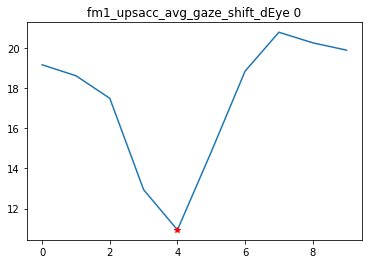

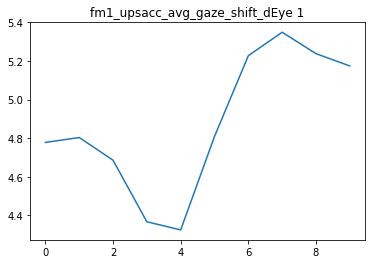

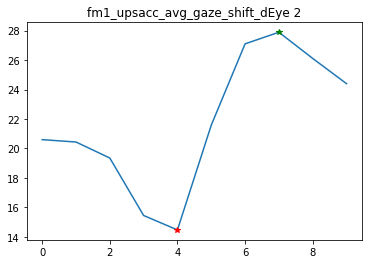

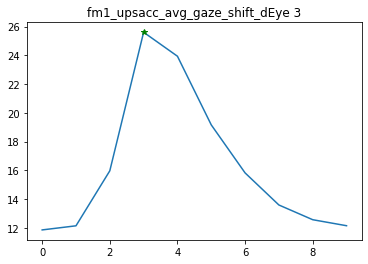

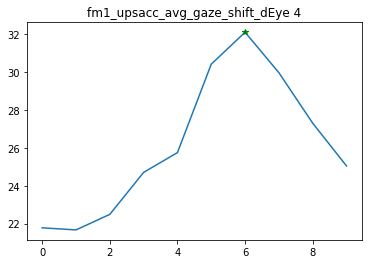

...

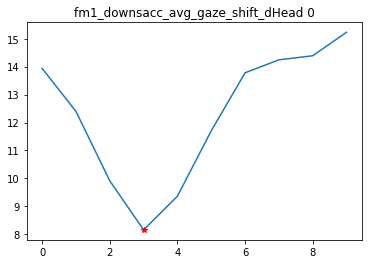

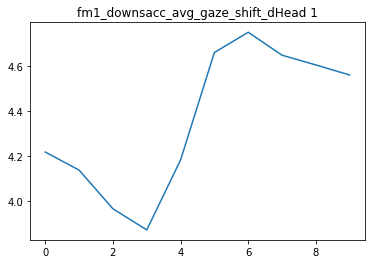

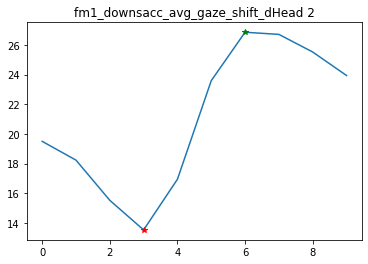

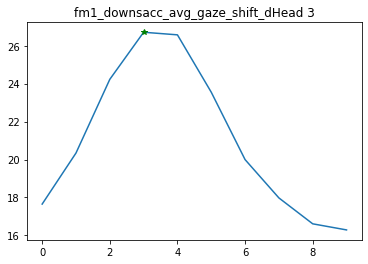

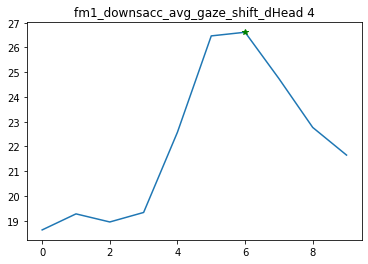

In [24]:
cluster_types = {}
for key, old_clusters in mean_cluster_all_keys.items():
    this_key = []
    for label in range(5):
        baseline = np.nanmean(old_clusters[label][:30])
        p, t = get_peak_trough(old_clusters[label][38:48], baseline)
        plt.plot(old_clusters[label][38:48], '-')
        if ~np.isnan(p):
            plt.plot(p, old_clusters[label][38:48][int(p)], 'g*')
        if ~np.isnan(t):
            plt.plot(t, old_clusters[label][38:48][int(t)], 'r*')
        plt.title(key+' '+str(label))
        plt.show()
        this_cluster = get_cluster_props(p, t)
        this_key.append(this_cluster)
    cluster_types[key] = this_key

In [25]:
for ind, row in df1.iterrows():
    for key in waveform_keys:
        if ~np.isnan(row[key+'_cluster']):
            df1.at[ind, key+'_cluster_type'] = cluster_types[key][int(row[key+'_cluster'])]

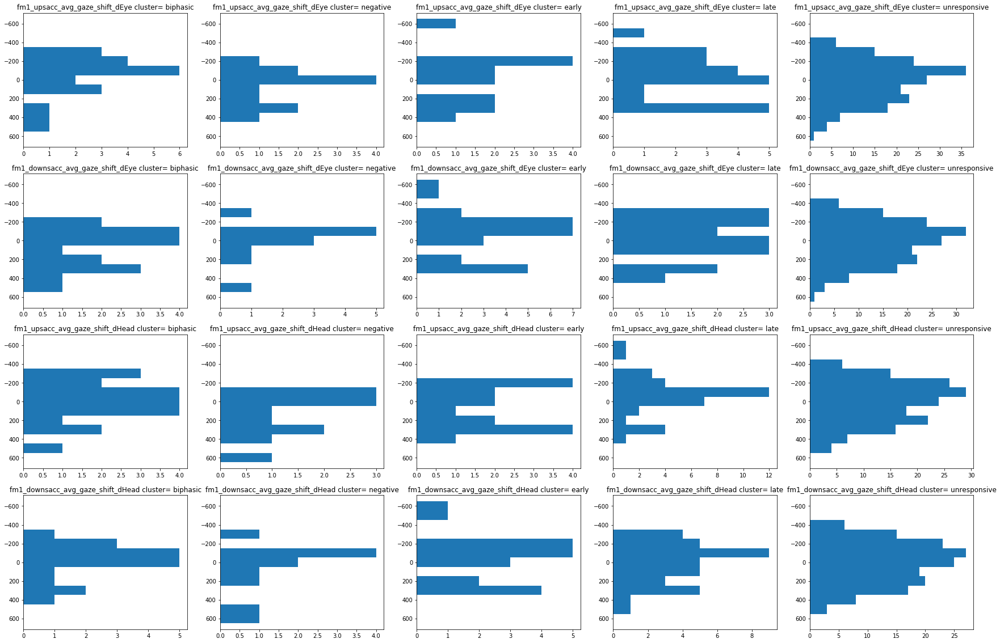

In [26]:
plt.subplots(4,5,figsize=(30,20))
count = 1
for key in waveform_keys:
    for label in ['biphasic','negative','early','late','unresponsive']:
        plt.subplot(4,5,count)
        plt.hist(df1['hf1_wn_depth_from_layer5'][df1[key+'_cluster_type']==label],bins=list(np.arange(-650,650+100,100)),orientation='horizontal')
        plt.title(key+' cluster= '+label)
        count += 1
        plt.gca().invert_yaxis()

In [35]:
def plot_cluster_prop(df1, cluster_prop, filter_for=None):
    y = df1[cluster_prop]
    if filter_for is not None:
        for key, val in filter_for.items():
            y = y[df1[key]==val]
    fig = plt.subplots(1,4,figsize=(25,6))
    count = 1
    for key in waveform_keys:
        plt.subplot(1,4,count)
        plt.title(key)
        for labelnum in range(5):
            label = ['biphasic','negative','early','late','unresponsive'][labelnum]
            data = list(y[df1[key+'_cluster_type']==label].dropna())
            box = plt.boxplot(data, positions=[labelnum], widths=0.7)
            plt.plot(np.ones(len(data))*labelnum, data, '.')
        plt.xticks(range(5), ['biphasic','negative','early','late','unresponsive'])
        plt.ylabel(cluster_prop)
        count += 1
    return fig

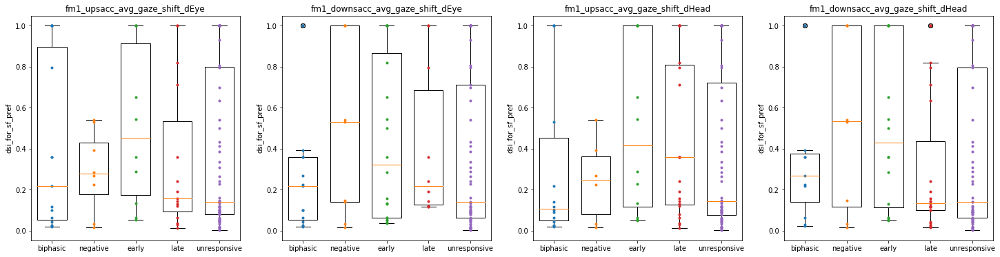

In [36]:
fig = plot_cluster_prop(df1, 'dsi_for_sf_pref', filter_for={'responsive_to_gratings':True})
plt.show()

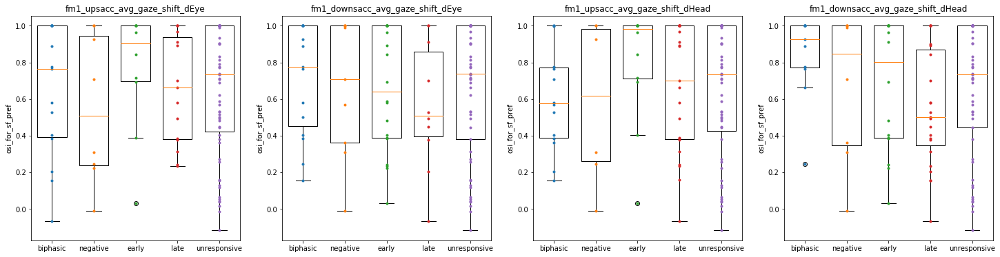

In [37]:
fig = plot_cluster_prop(df1, 'osi_for_sf_pref', filter_for={'responsive_to_gratings':True})
plt.show()

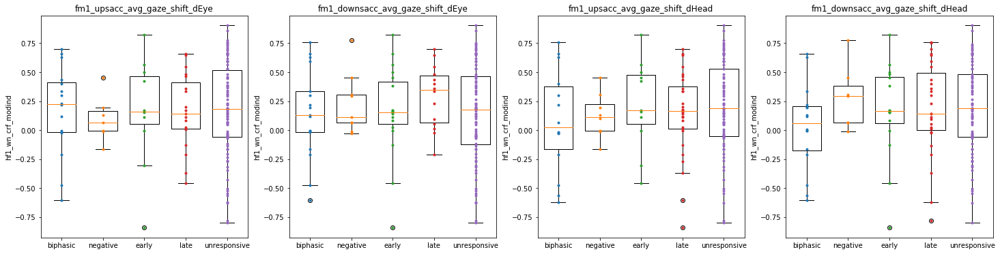

In [38]:
fig = plot_cluster_prop(df1, 'hf1_wn_crf_modind', filter_for={'responsive_to_contrast':True})
plt.show()

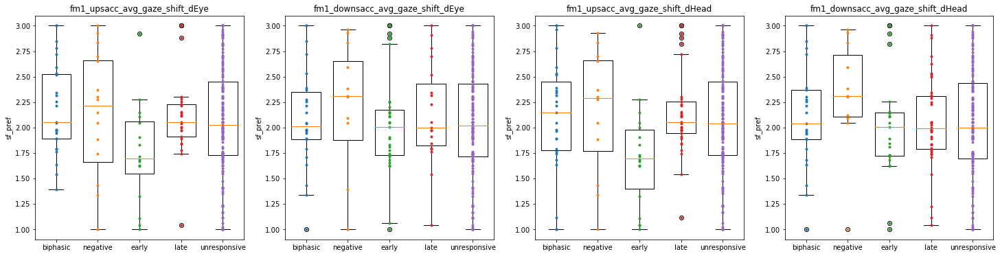

In [39]:
fig = plot_cluster_prop(df1, 'sf_pref', filter_for={'responsive_to_gratings':True})
plt.show()

In [40]:
for ind, row in df1.iterrows():
    if type(row['hf3_gratings_ori_tuning_tf']) != float:
        tuning = np.nanmean(row['hf3_gratings_ori_tuning'],1)
        tuning = tuning - row['hf3_gratings_drift_spont']
        tuning[tuning < 0] = 0
        mean_for_tf = np.array([np.mean(tuning[:,0]), np.mean(tuning[:,1])])
        tf_pref = ((mean_for_tf[0]*1)+(mean_for_tf[1]*2))/np.sum(mean_for_tf)
        df1.at[ind, 'tf_pref'] = tf_pref

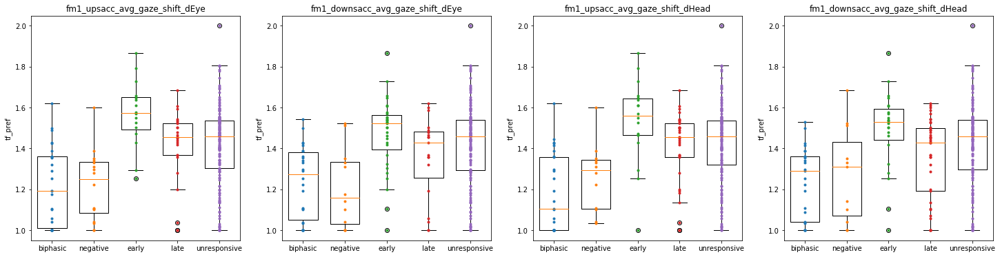

In [41]:
fig = plot_cluster_prop(df1, 'tf_pref', filter_for={'responsive_to_gratings':True})
plt.show()

In [64]:
import itertools

In [68]:
waveform_key_pairs = list(itertools.combinations(waveform_keys, 2))
waveform_key_pairs

[('fm1_upsacc_avg_gaze_shift_dEye', 'fm1_downsacc_avg_gaze_shift_dEye'),
 ('fm1_upsacc_avg_gaze_shift_dEye', 'fm1_upsacc_avg_gaze_shift_dHead'),
 ('fm1_upsacc_avg_gaze_shift_dEye', 'fm1_downsacc_avg_gaze_shift_dHead'),
 ('fm1_downsacc_avg_gaze_shift_dEye', 'fm1_upsacc_avg_gaze_shift_dHead'),
 ('fm1_downsacc_avg_gaze_shift_dEye', 'fm1_downsacc_avg_gaze_shift_dHead'),
 ('fm1_upsacc_avg_gaze_shift_dHead', 'fm1_downsacc_avg_gaze_shift_dHead')]

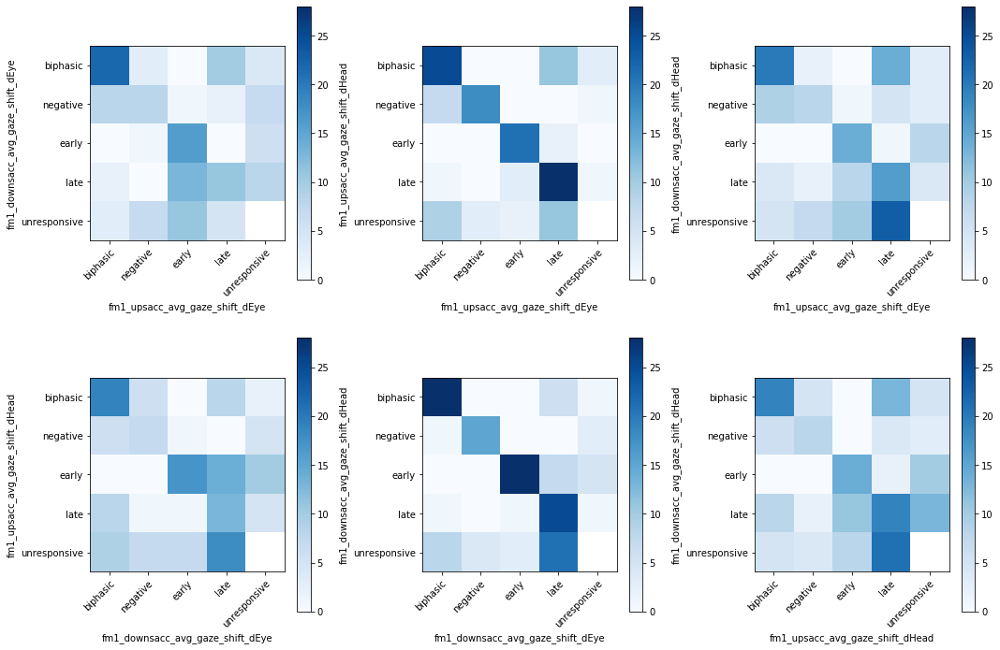

In [104]:
count = 1
fig, axes = plt.subplots(2,3,figsize=(15,10))
for this_key_pair in waveform_key_pairs:
    count_matrix = np.zeros([5,5])
    cluster_dict = {'biphasic':0, 'negative':1, 'early':2, 'late':3, 'unresponsive':4}
    key0 = this_key_pair[0]
    key1 = this_key_pair[1]
    for ind, row in df1.iterrows():
        if type(row[key0+'_cluster_type'])==str and type(row[key1+'_cluster_type'])==str:
            first_cluster = row[key0+'_cluster_type']
            second_cluster = row[key1+'_cluster_type']
            pos0 = cluster_dict[first_cluster]
            pos1 = cluster_dict[second_cluster]
            count_matrix[pos0, pos1] = count_matrix[pos0, pos1] + 1
    for i in range(4,5):
        count_matrix[i,i] = np.nan
    ax = plt.subplot(2,3,count)
    im = plt.imshow(count_matrix, cmap='Blues', vmin=0, vmax=28)
    ax.set_xticks(np.arange(5))
    ax.set_xticklabels(['biphasic','negative','early','late','unresponsive'])
    ax.set_yticks(np.arange(5))
    ax.set_yticklabels(['biphasic','negative','early','late','unresponsive'])
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")
    plt.xlabel(key0); plt.ylabel(key1)
    count += 1
    plt.colorbar(im)
plt.tight_layout()

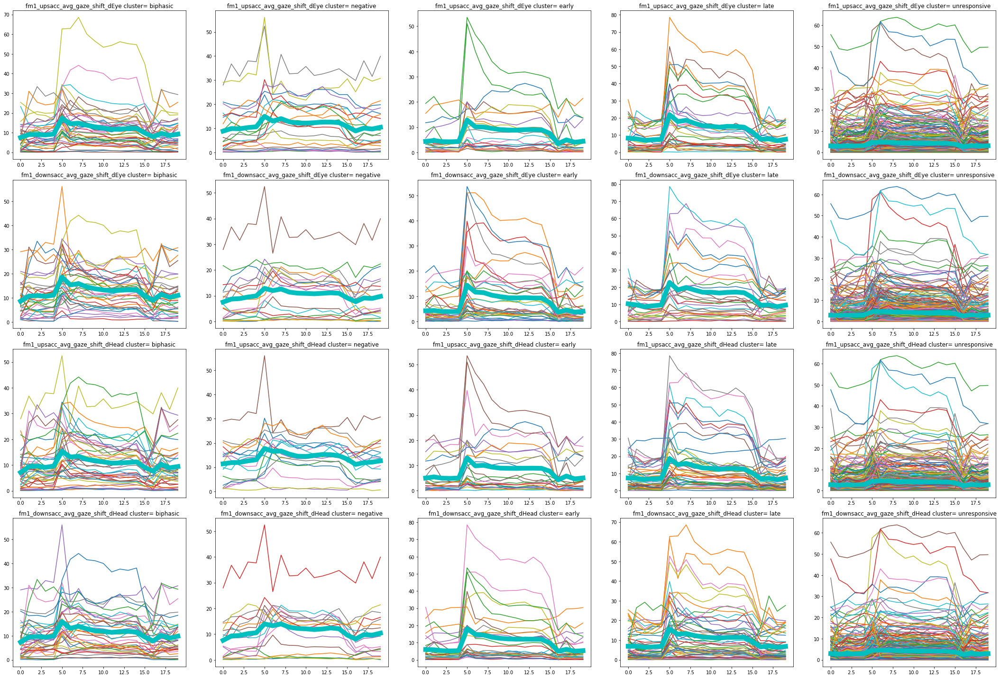

In [113]:
# psth overlayed with mean of all units in a cluster
plt.subplots(4,5,figsize=(30,20))
count = 0
for waveform_key in waveform_keys:
    for labelnum in range(5):
        count += 1
        label = ['biphasic','negative','early','late','unresponsive'][labelnum]
        plt.subplot(4,5,count)
        all_psth = df1['hf3_gratings_grating_psth'][df1[waveform_key+'_cluster_type']==label]
        for i in range(len(all_psth)):
            plt.plot(all_psth.iloc[i])
        plt.plot(df1['hf3_gratings_grating_psth'][df1[waveform_key+'_cluster_type']==label].mean(), color='c', linewidth=10)
        plt.title(waveform_key+' cluster= '+label)
plt.tight_layout()

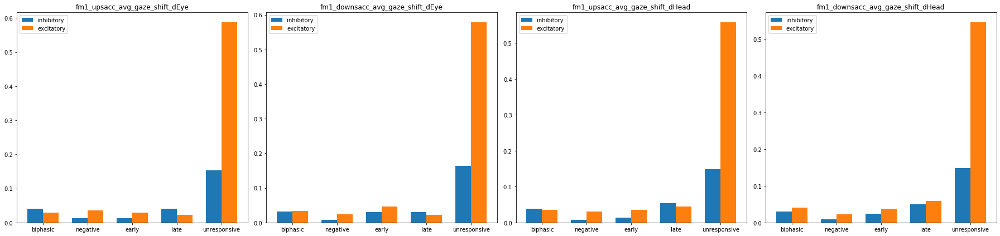

In [130]:
# fraction of all inhibitory and excitatory units are in each cluster
fig, axes = plt.subplots(1,4,figsize=(25,6))
count = 0
for waveform_key in waveform_keys:
    key_data = np.zeros([5,2])
    count += 1
    for labelnum in range(5):
        label = ['biphasic','negative','early','late','unresponsive'][labelnum]
        frac_inh = len(df1[df1[waveform_key+'_cluster_type']==label][df1['waveform_km_label']==0])
        frac_exc = len(df1[df1[waveform_key+'_cluster_type']==label][df1['waveform_km_label']==1])
        key_data[labelnum, 0] = frac_inh
        key_data[labelnum, 1] = frac_exc
    labels = ['biphasic','negative','early','late','unresponsive']
    ax = plt.subplot(1,4,count)
    x = np.arange(len(labels))
    width = 0.35
    plt.bar(x - width/2, key_data[:,0]/len(df1), width=width, label='inhibitory')
    plt.bar(x + width/2, key_data[:,1]/len(df1), width=width, label='excitatory')
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.legend()
    plt.title(waveform_key)
plt.tight_layout()
plt.show()

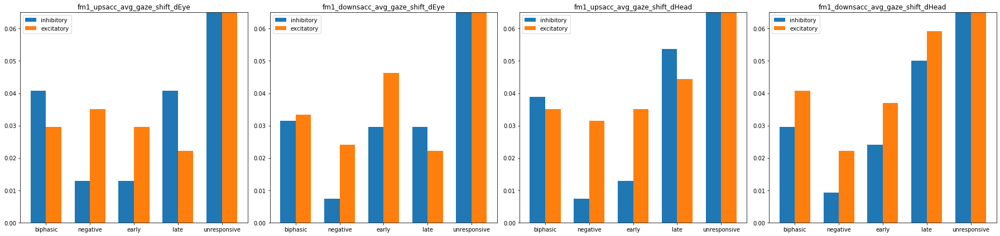

In [129]:
# fraction of all inhibitory and excitatory units are in each cluster
fig, axes = plt.subplots(1,4,figsize=(25,6))
count = 0
for waveform_key in waveform_keys:
    key_data = np.zeros([5,2])
    count += 1
    for labelnum in range(5):
        label = ['biphasic','negative','early','late','unresponsive'][labelnum]
        frac_inh = len(df1[df1[waveform_key+'_cluster_type']==label][df1['waveform_km_label']==0])
        frac_exc = len(df1[df1[waveform_key+'_cluster_type']==label][df1['waveform_km_label']==1])
        key_data[labelnum, 0] = frac_inh
        key_data[labelnum, 1] = frac_exc
    labels = ['biphasic','negative','early','late','unresponsive']
    ax = plt.subplot(1,4,count)
    x = np.arange(len(labels))
    width = 0.35
    plt.bar(x - width/2, key_data[:,0]/len(df1), width=width, label='inhibitory')
    plt.bar(x + width/2, key_data[:,1]/len(df1), width=width, label='excitatory')
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.legend()
    plt.title(waveform_key)
    plt.ylim([0,0.065])
plt.tight_layout()
plt.show()

In [164]:
def movement_modulation_index(trange, saccavg, cluster):
    t0ind = int((np.abs(trange-0)).argmin())
    baseline = np.nanmean(saccavg[0:int(t0ind-((1/4)*t0ind))])
    if cluster == 0:
        return np.nan, np.nan
    elif cluster == 1:
        peak_ind = np.argmax(saccavg[35:55])
        trough_ind = np.argmin(saccavg[35:55])
        return (saccavg[trough_ind] - baseline) / (saccavg[trough_ind] + baseline), (saccavg[peak_ind] - baseline) / (saccavg[peak_ind] + baseline)
    elif cluster == 2 or cluster == 3:
        peak_ind = np.argmax(saccavg[35:55])
        return np.nan, (saccavg[peak_ind] - baseline) / (saccavg[peak_ind] + baseline)
    elif cluster == 4:
        trough_ind = np.argmin(saccavg[35:55])
        return (saccavg[trough_ind] - baseline) / (saccavg[trough_ind] + baseline), np.nan

In [169]:
for ind, row in df1.iterrows():
    for key in waveform_keys:
        if type(row[key]) != float:
            p, t = movement_modulation_index(row['fm1_trange'], row[key], row[key+'_cluster'])
            df1.at[ind, key+'peak_modind'] = p
            df1.at[ind, key+'trough_modind'] = t
        else:
            df1.at[ind, key+'peak_modind'] = np.nan
            df1.at[ind, key+'trough_modind'] = np.nan

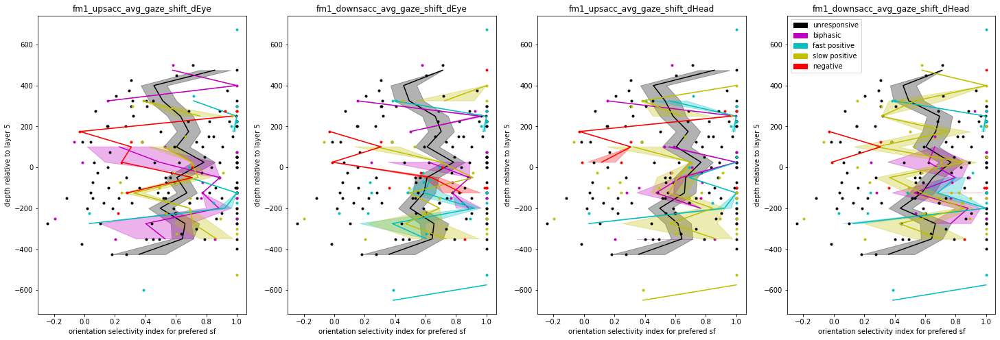

In [212]:
force_range = np.arange(-650,650+75,75)
plt.subplots(1,4,figsize=(25,8))
for keynum in range(len(waveform_keys)):
    key = waveform_keys[keynum]
    plt.subplot(1,4,keynum+1)
    plt.title(key)
    for label in range(5):
        c = ['k', 'm', 'c', 'y', 'r'][label]
        x = df1['osi_for_sf_pref'][df1[key+'_cluster']==label]
        y = df1['hf1_wn_depth_from_layer5'][df1[key+'_cluster']==label]
        plt.plot(x, y, c+'.')
        bin_means, bin_edges, bin_number = stats.binned_statistic(y, x, statistic=np.nanmean, bins=force_range)
        bin_std, _, _ = stats.binned_statistic(y, x, statistic=np.nanstd, bins=force_range)
        hist, _ = np.histogram(y, bins=force_range)
        tuning_err = bin_std / np.sqrt(hist)
        plt.plot(bin_means, bin_edges[:-1], c+'-')
        plt.fill_betweenx(bin_edges[:-1], bin_means-tuning_err, bin_means+tuning_err, color=c, alpha=0.3)
        plt.xlabel('orientation selectivity index for prefered sf'); plt.ylabel('depth relative to layer 5')
patchk = mpatches.Patch(color='k', label='unresponsive')
patchm = mpatches.Patch(color='m', label='biphasic')
patchc = mpatches.Patch(color='c', label='fast positive')
patchy = mpatches.Patch(color='y', label='slow positive')
patchr = mpatches.Patch(color='r', label='negative')
plt.legend(handles=[patchk, patchm, patchc, patchy, patchr])

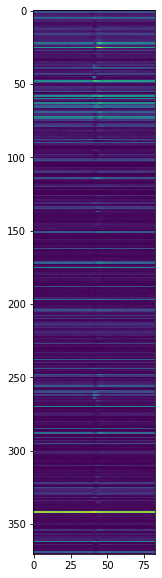

In [192]:
plt.figure(figsize=(5,10))
plt.imshow(flat_waveforms[~np.isnan(flat_waveforms).any(axis=1)])

In [197]:
km_inds = df1[waveform_key+'_CENT'][~np.isnan(flat_waveforms).any(axis=1)].index.values
len(km_inds)

371

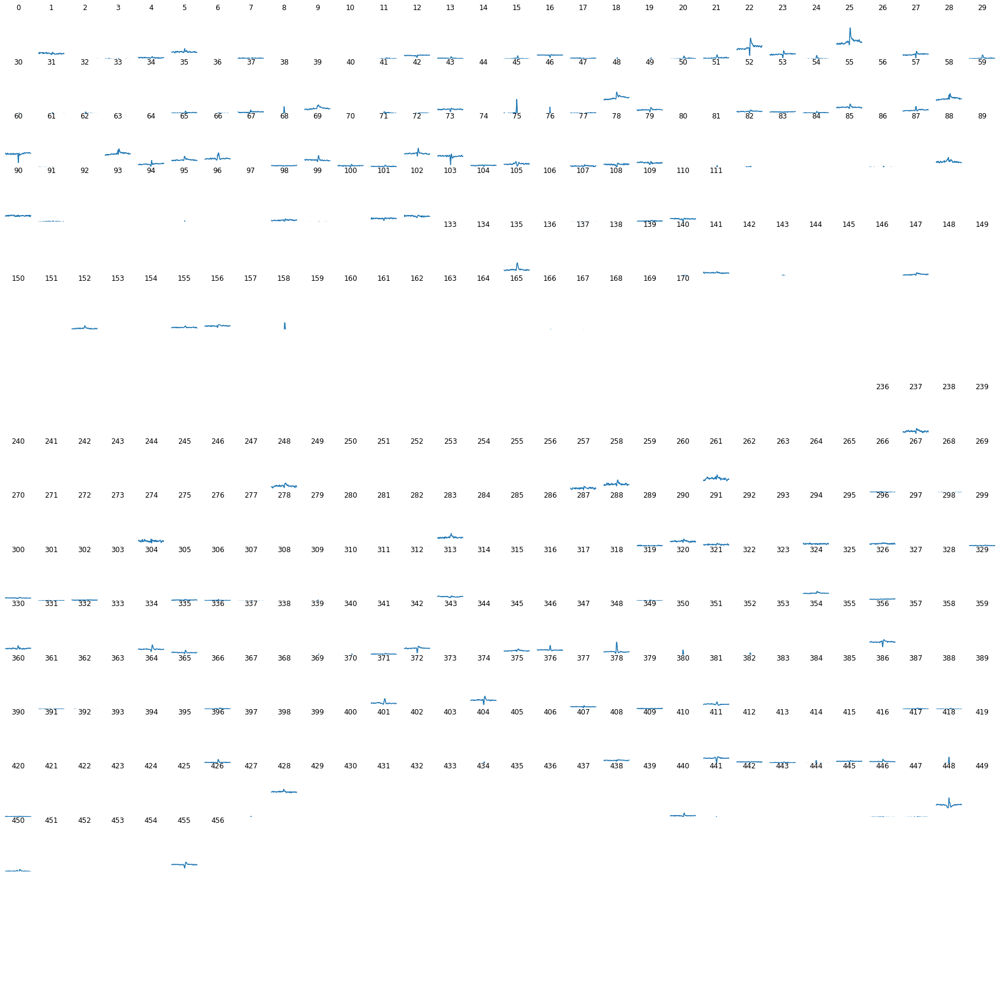

In [216]:
num = len(df1['fm1_upsacc_avg_gaze_shift_dEye'])
plt.subplots(int(np.ceil(num/30)), 30, figsize=(30,30))
for i in range(num):
    plt.subplot(int(np.ceil(num/30)), 30, i+1)
    waveform = df1['fm1_upsacc_avg_gaze_shift_dEye'].iloc[i]
    if type(waveform) != float:
        waveform_centered = [i-baseline for i in waveform]
        plt.plot(waveform_centered); plt.title(i)
    plt.axis('off')
    plt.ylim([0,150])
plt.show()

In [33]:
np.shape(nested_waveforms[5][:5])

(5,)

In [66]:
nested_waveforms[5]

[3.5914285714285654,
 1.3771428571428643,
 3.5914285714285867,
 3.3771428571428643,
 4.805714285714245,
 5.87714285714295,
 6.234285714285136,
 6.805714285713705,
 2.5200000000000813,
 2.377142857142921,
 2.734285714285228,
 2.6628571428566588,
 1.5914285714286436,
 0.5200000000000955,
 0.8771428571423812,
 1.5914285714280894,
 1.0914285714287004,
 1.6628571428572272,
 -0.1228571428575691,
 0.8771428571423954,
 1.5200000000001097,
 5.448571428571533,
 2.305714285713819,
 1.1628571428566872,
 -1.3371428571427302]

In [68]:
nested_waveforms[i] - np.mean(nested_waveforms[i][:4])

TypeError: 'float' object is not subscriptable

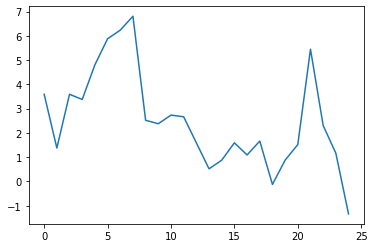

In [72]:
plt.plot(nested_waveforms[5])

In [71]:
np.max(np.abs(nested_waveforms[5]))

6.805714285713705

In [88]:
np.sum([np.isnan(nested_waveforms[i]).all() for i in range(len(nested_waveforms))])

169

labeling saccade waveforms


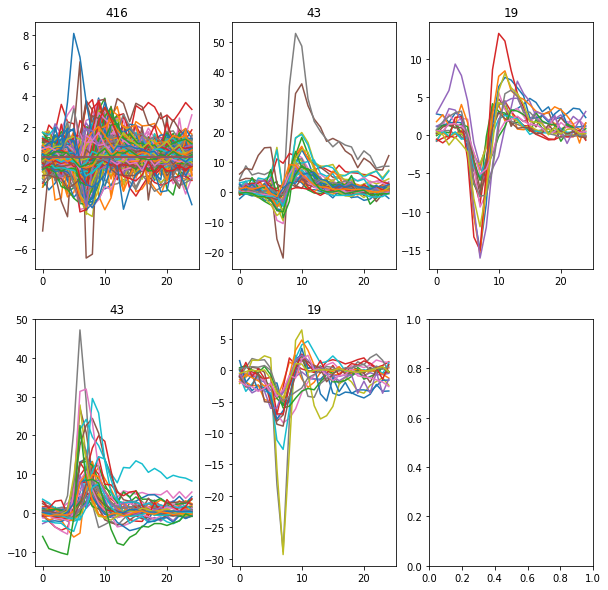

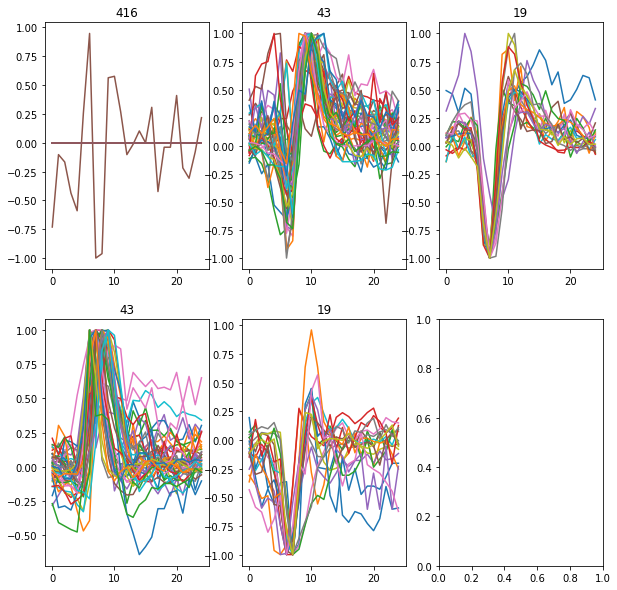

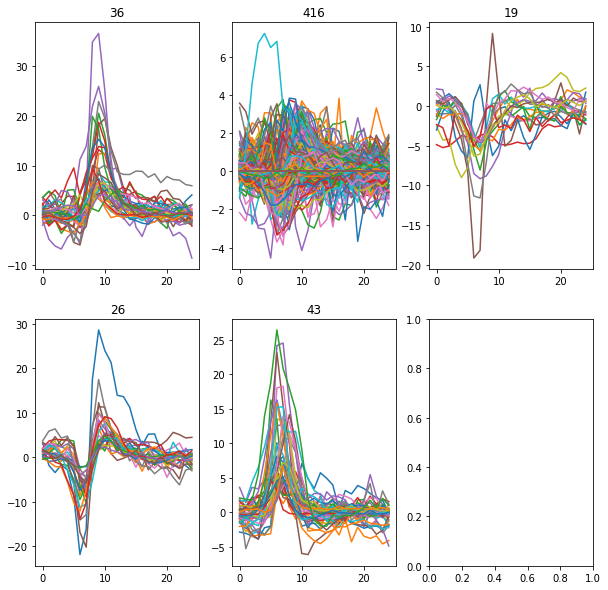

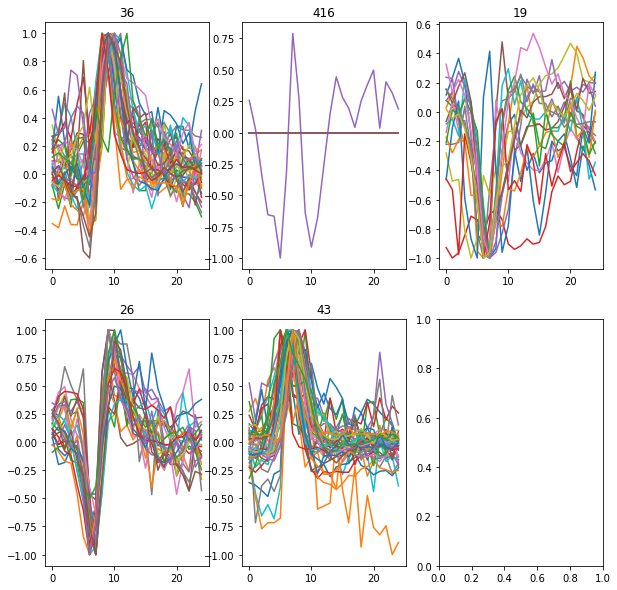

In [85]:
print('labeling saccade waveforms')
for waveform_key in ['fm1_upsacc_avg_gaze_shift_dEye', 'fm1_downsacc_avg_gaze_shift_dEye']:
    df1[waveform_key+'_CENT'] = df1[waveform_key].copy()
    df1[waveform_key+'_KM'] = np.nan
    baselines = []
    for ind, row in df1.iterrows():
        waveform = row[waveform_key]
        if type(waveform) == np.ndarray:
            baseline = np.mean(waveform[:25])
            waveform_centered = [i-baseline for i in waveform]
            df1.at[ind, waveform_key+'_CENT'] = waveform_centered[35:60]
            baselines.append(baseline)
        else:
            baselines.append(np.nan)
    nested_waveforms = df1[waveform_key+'_CENT'].to_numpy()
    wvlen = len(nested_waveforms[0])
    flat_waveforms = np.zeros([len(nested_waveforms), wvlen])
    unnorm_waveforms = np.zeros([len(nested_waveforms), wvlen])
    for i in range(len(nested_waveforms)):
        if ~np.isnan(nested_waveforms[i]).all():
#             baseline_sub = [j - np.mean(nested_waveforms[i][:4]) for j in nested_waveforms[i]]
            if (np.max(np.abs(nested_waveforms[i]))/baselines[i]) > 0.1 and np.max(np.abs(nested_waveforms[i]))>4:
                flat_waveforms[i,:] = nested_waveforms[i] / np.max(np.abs(nested_waveforms[i]))
            unnorm_waveforms[i,:] = nested_waveforms[i]
    km_inds = df1[waveform_key+'_CENT'][~np.isnan(flat_waveforms).any(axis=1)].index.values
    km_labels = KMeans(n_clusters=5).fit(flat_waveforms[~np.isnan(flat_waveforms).any(axis=1)]).labels_
    count = 0
    for ind in km_inds:
        df1.at[ind, waveform_key+'_KM'] = km_labels[count]
        count += 1
    plt.subplots(2,3,figsize=(10,10))
    for label in range(5):
        plt.subplot(2,3,label+1)
        plt.title(np.sum(km_labels==label))
        plt.plot(unnorm_waveforms[km_labels==label,:].T)
    plt.subplots(2,3,figsize=(10,10))
    for label in range(5):
        plt.subplot(2,3,label+1)
        plt.title(np.sum(km_labels==label))
        plt.plot(flat_waveforms[km_labels==label,:].T)
    plt.show()

In [76]:
len(baselines)

371

In [ ]:
len(nested_waveforms)

In [ ]:
plt.plot(flat_waveforms)

In [48]:
km_inds==labels

False

In [46]:
flat_waveforms[]

(540, 25)

In [ ]:
np.shape(flat_waveforms)

In [42]:
flat_waveforms[km_inds==label]

array([[ 0.24496644, -0.04026846,  0.09395973, -0.3590604 ,  0.06040268,
         0.27852349,  0.76510067,  0.41275168,  0.39597315,  1.        ,
         0.2114094 ,  0.2114094 ,  0.04362416,  0.27852349,  0.06040268,
         0.27852349, -0.39261745, -0.34228188, -0.27516779,  0.22818792,
         0.24496644, -0.10738255,  0.07718121, -0.00671141, -0.44295302]])

labeling saccade waveforms


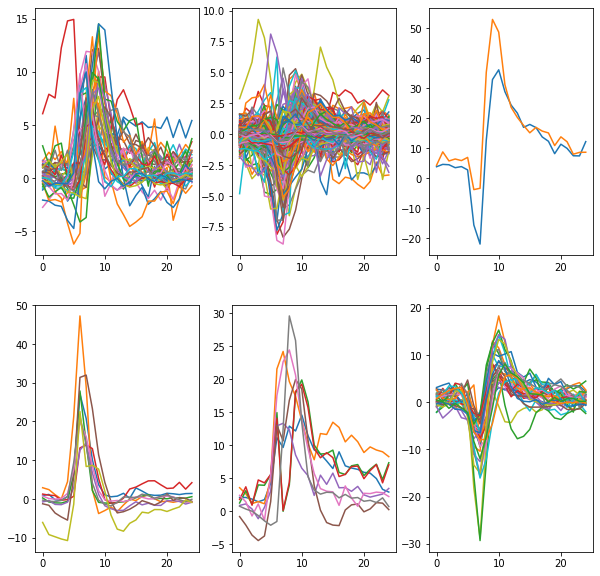

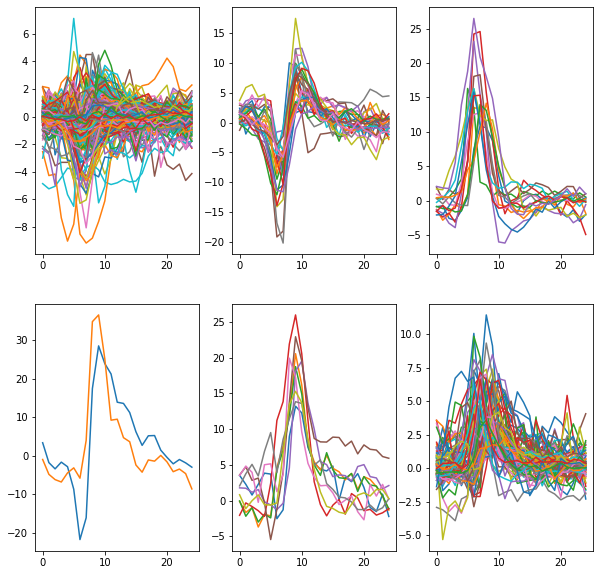

In [24]:
print('labeling saccade waveforms')
for waveform_key in ['fm1_upsacc_avg_gaze_shift_dEye', 'fm1_downsacc_avg_gaze_shift_dEye']:
    df1[waveform_key+'_CENT'] = df1[waveform_key].copy()
    df1[waveform_key+'_KM'] = np.nan
    for ind, row in df1.iterrows():
        waveform = row[waveform_key]
        if type(waveform) == np.ndarray:
            baseline = np.mean(waveform[:25])
            waveform_centered = [i-baseline for i in waveform]
            df1.at[ind, waveform_key+'_CENT'] = waveform_centered[35:60]
    nested_waveforms = df1[waveform_key+'_CENT'].to_numpy()
    wvlen = len(nested_waveforms[0])
    flat_waveforms = np.zeros([len(nested_waveforms), wvlen])
    for i in range(len(nested_waveforms)):
        flat_waveforms[i,:] = nested_waveforms[i]
    km_inds = df1[waveform_key+'_CENT'][~np.isnan(flat_waveforms).any(axis=1)].index.values
    km_labels = KMeans(n_clusters=6).fit(flat_waveforms[~np.isnan(flat_waveforms).any(axis=1)]).labels_
    count = 0
    for ind in km_inds:
        df1.at[ind, waveform_key+'_KM'] = km_labels[count]
        count += 1
    plt.subplots(2,3,figsize=(10,10))
    for ind, row in df1.iterrows():
        if row[waveform_key+'_KM'] == 0:
            plt.subplot(2,3,1)
            plt.plot(row[waveform_key+'_CENT'])
        elif row[waveform_key+'_KM'] == 1:
            plt.subplot(2,3,2)
            plt.plot(row[waveform_key+'_CENT'])
        elif row[waveform_key+'_KM'] == 2:
            plt.subplot(2,3,3)
            plt.plot(row[waveform_key+'_CENT'])
        elif row[waveform_key+'_KM'] == 3:
            plt.subplot(2,3,4)
            plt.plot(row[waveform_key+'_CENT'])
        elif row[waveform_key+'_KM'] == 4:
            plt.subplot(2,3,5)
            plt.plot(row[waveform_key+'_CENT'])
        elif row[waveform_key+'_KM'] == 5:
            plt.subplot(2,3,6)
            plt.plot(row[waveform_key+'_CENT'])
    plt.show()

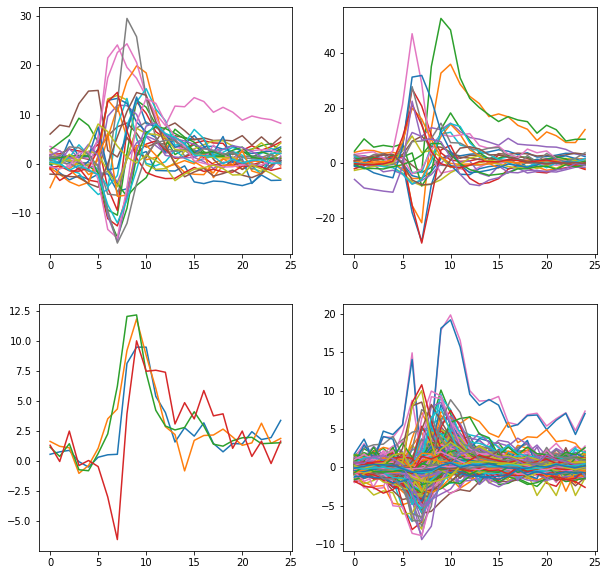

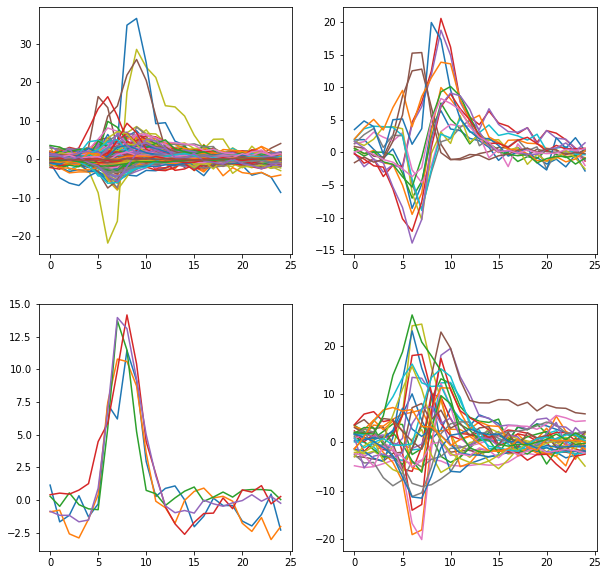

In [27]:
for waveform_key in ['fm1_upsacc_avg_gaze_shift_dEye', 'fm1_downsacc_avg_gaze_shift_dEye']:
    df1[waveform_key+'_CENT'] = df1[waveform_key].copy()
    df1[waveform_key+'_KM'] = np.nan
    for ind, row in df1.iterrows():
        waveform = row[waveform_key]
        if type(waveform) == np.ndarray:
            baseline = np.mean(waveform[:25])
            waveform_centered = [i-baseline for i in waveform]
            df1.at[ind, waveform_key+'_CENT'] = waveform_centered[35:60]
    nested_waveforms = df1[waveform_key+'_CENT'].to_numpy()
    wvlen = len(nested_waveforms[0])
    flat_waveforms = np.zeros([len(nested_waveforms), wvlen])
    for i in range(len(nested_waveforms)):
        flat_waveforms[i,:] = nested_waveforms[i]
    km_inds = df1[waveform_key+'_CENT'][~np.isnan(flat_waveforms).any(axis=1)].index.values
    labels = SpectralClustering(n_clusters=4, assign_labels='discretize').fit(flat_waveforms[~np.isnan(flat_waveforms).any(axis=1)]).labels_
    count = 0
    for ind in km_inds:
        df1.at[ind, waveform_key+'_KM'] = labels[count]
        count += 1
    plt.subplots(2,2,figsize=(10,10))
    for ind, row in df1.iterrows():
        if row[waveform_key+'_KM'] == 0:
            plt.subplot(2,2,1)
            plt.plot(row[waveform_key+'_CENT'])
        elif row[waveform_key+'_KM'] == 1:
            plt.subplot(2,2,2)
            plt.plot(row[waveform_key+'_CENT'])
        elif row[waveform_key+'_KM'] == 2:
            plt.subplot(2,2,3)
            plt.plot(row[waveform_key+'_CENT'])
        elif row[waveform_key+'_KM'] == 3:
            plt.subplot(2,2,4)
            plt.plot(row[waveform_key+'_CENT'])
    plt.show()

In [22]:
labels

array([0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
       2, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0,
       0, 0, 0, 0, 2, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0,
       0, 2, 0, 0, 0, 0, 2, 3, 0, 2, 0, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0,
       2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 2, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,

In [87]:
waveform = df1['fm1_upsacc_avg_gaze_shift_dEye'].iloc[25]

In [249]:
type(df1['fm1_upsacc_avg_gaze_shift_dEye'].iloc[25])

numpy.ndarray

In [88]:
baseline = np.mean(waveform[:30])
print(baseline)

60.32447171097443


In [247]:
(np.abs(df1['hf1_wn_trange'].iloc[0]-0)).argmin()

40

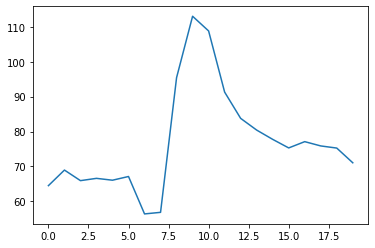

In [89]:
plt.plot(waveform[35:55])

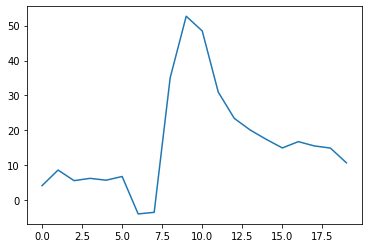

In [90]:
wv = [i-baseline for i in waveform[35:55]]
plt.plot(wv)

ValueError: cannot convert float NaN to integer

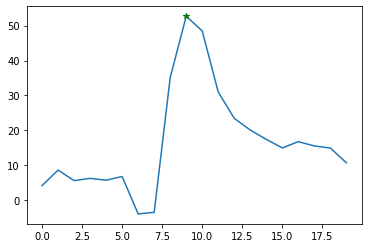

In [101]:
plt.plot(wv)
p, t = get_waveform_peaks(wv)
plt.plot(p, wv[int(p)], 'g*')
plt.plot(t, wv[int(t)], 'r*')

In [69]:
p

9

In [25]:
np.max(wv)/2

26.34083162917526

(array([9., 8., 3., 1., 1., 0., 0., 1., 0., 2.]),
 array([-8.65897036, -4.12854914,  0.40187207,  4.93229329,  9.46271451,
        13.99313573, 18.52355694, 23.05397816, 27.58439938, 32.11482059,
        36.64524181]),
 <a list of 10 Patch objects>)

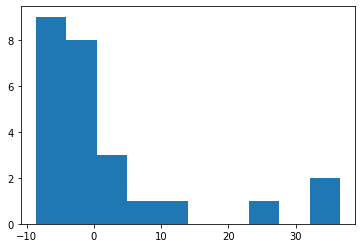

In [19]:
plt.hist(flat_waveforms[25])

In [13]:
def get_waveform_peaks(wv):
    wv_flip = [-i for i in wv]
    wv = wv / np.max(wv)
    wv_flip = wv_flip / np.max(wv_flip)
    peaks, peak_props = find_peaks(wv, height=0.80, threshold=0.05)
    troughs, trough_props = find_peaks(wv_flip, height=0.90, threshold=0.10)
    if len(peaks) > 1:
        peaks = peaks[np.argmax(peak_props['peak_heights'])]
    if len(troughs) > 1:
        troughs = troughs[np.argmax(trough_props['peak_heights'])]
    if peaks.size == 0:
        peaks = np.nan
    if troughs.size == 0:
        troughs = np.nan
    if ~np.isnan(peaks):
        peaks = int(peaks)
    if ~np.isnan(troughs):
        troughs = int(troughs)
    return peaks, troughs

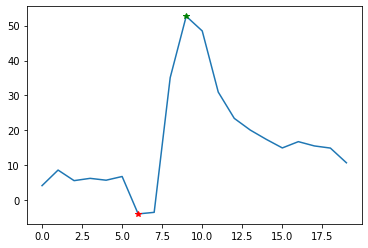

In [14]:
ex_waveform = df1['fm1_upsacc_avg_gaze_shift_dEye'].iloc[25]
ex_baseline = np.mean(ex_waveform[:30])
ex_wv = [i-ex_baseline for i in ex_waveform[35:55]]
plt.plot(ex_wv)
p, t = get_waveform_peaks(ex_wv)
plt.plot(p, ex_wv[p], 'g*')
plt.plot(t, ex_wv[t], 'r*')

In [15]:
p

9

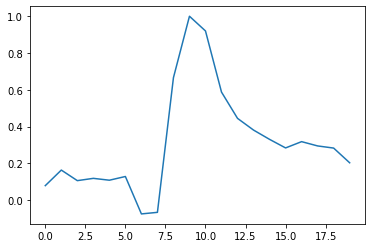

In [16]:
plt.plot(ex_wv / np.max(ex_wv))

labeling saccade waveforms


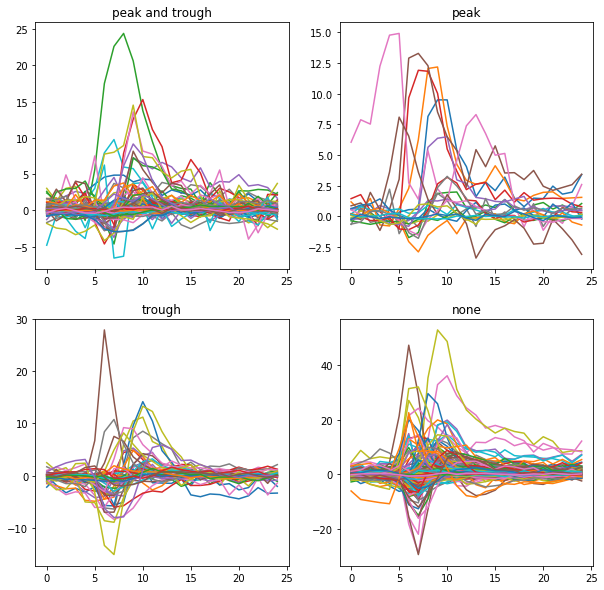

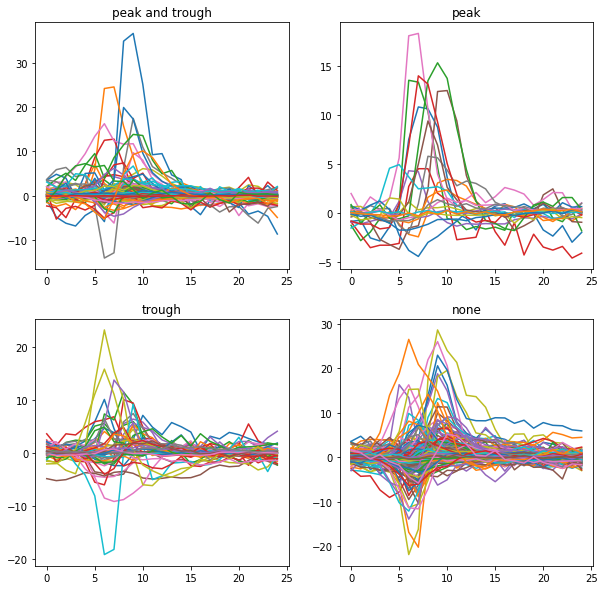

In [17]:
print('labeling saccade waveforms')
for waveform_key in ['fm1_upsacc_avg_gaze_shift_dEye', 'fm1_downsacc_avg_gaze_shift_dEye']:
    df1[waveform_key+'_CENT'] = df1[waveform_key].copy()
    df1[waveform_key+'_KM'] = np.nan
    for ind, row in df1.iterrows():
        waveform = row[waveform_key]
        if type(waveform) == np.ndarray:
            baseline = np.mean(waveform[:25])
            waveform_centered = [i-baseline for i in waveform]
            df1.at[ind, waveform_key+'_CENT'] = waveform_centered[35:60]
    nested_waveforms = df1[waveform_key+'_CENT'].to_numpy()
    wvlen = len(nested_waveforms[0])
    flat_waveforms = np.zeros([len(nested_waveforms), wvlen])
    for i in range(len(nested_waveforms)):
        flat_waveforms[i,:] = nested_waveforms[i]
    km_inds = df1[waveform_key+'_CENT'][~np.isnan(flat_waveforms).any(axis=1)].index.values
    peaks = []
    troughs = []
    for unit in range(np.size(flat_waveforms, 0)):
        p, t = get_waveform_peaks(flat_waveforms[unit])
        peaks.append(p); troughs.append(t)
    unit = 0
    for ind in km_inds:
        bool_key = np.isnan(list(zip(peaks, troughs)))
        key = bool_key[unit]
        if (key == [True, True]).all():
            df1.at[ind, waveform_key+'_CLUSTER'] = 0
        elif (key == [True, False]).all():
            df1.at[ind, waveform_key+'_CLUSTER'] = 1
        elif (key == [False, True]).all():
            df1.at[ind, waveform_key+'_CLUSTER'] = 2
        elif (key == [False, False]).all():
            df1.at[ind, waveform_key+'_CLUSTER'] = 3
        unit += 1
    plt.subplots(2,2,figsize=(10,10))
    count = 0
    for ind, row in df1.iterrows():
        if ind in km_inds:
            if row[waveform_key+'_CLUSTER'] == 0:
                plt.subplot(2,2,1)
                plt.title('peak and trough')
                plt.plot(row[waveform_key+'_CENT'])
#                 plt.plot(peaks[count], row[waveform_key+'_CENT'][peaks[count]], 'g*')
#                 plt.plot(troughs[count], row[waveform_key+'_CENT'][troughs[count]], 'r*')
            elif row[waveform_key+'_CLUSTER'] == 1:
                plt.subplot(2,2,2)
                plt.title('peak')
                plt.plot(row[waveform_key+'_CENT'])
#                 plt.plot(peaks[count], row[waveform_key+'_CENT'][peaks[count]], 'g*')
            elif row[waveform_key+'_CLUSTER'] == 2:
                plt.subplot(2,2,3)
                plt.title('trough')
                plt.plot(row[waveform_key+'_CENT'])
#                 plt.plot(troughs[count], row[waveform_key+'_CENT'][troughs[count]], 'r*')
            elif row[waveform_key+'_CLUSTER'] == 3:
                plt.subplot(2,2,4)
                plt.title('none')
                plt.plot(row[waveform_key+'_CENT'])
            count += 1
    plt.show()

In [119]:
df1[waveform_key+'_CLUSTER']

0      0.0
1      0.0
2      0.0
3      0.0
4      0.0
      ... 
541    NaN
545    NaN
549    NaN
536    NaN
542    NaN
Name: fm1_upsacc_avg_gaze_shift_dEye_CLUSTER, Length: 540, dtype: float64

In [117]:
peaks[count]

nan

In [111]:
(key == [True, True]).all()

True

In [112]:
key

array([ True,  True])

In [113]:
list(zip(peaks, troughs))

[(nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (10, 6),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (6, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (7, nan),
 (10, nan),
 (nan, nan),
 (nan, 7),
 (nan, nan),
 (nan, nan),
 (10, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, 7),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),

In [182]:
wvlen = len(test[0])
new = np.zeros([len(test), wvlen])
for i in range(len(test)):
    new[i,:] = test[i]